<h2>Лабораторная работа N 7</h2>
<h3>Цель работы:</h3>
Лабораторная работа проверяет знания функций Бернштейна, использование этих функ-
ций в качестве базиса для построения кривых Безье. Использование алгоритма де Кастельжо
для эффективного вычисления точек кривой Безье.

In [1]:
using Plots # Подключаем библиотеку

<h3><b>Задание N 1</b></h3> 
Написать функцию, которая вычисляет значения полинома Бернштейна B n i (t) для задан-
ных параметров i, n и t. Сколько полиномов существует при n = 5? Постройте их графики
и сверьте с картинками из презентации.

Создадим функции:

In [34]:
# Число сочетаний из n по k
function C(n, k)
    try
        return factorial(n)/(factorial(k) * factorial(n-k))
    catch
        return 0
    end
end;

In [35]:
# Полиномы Бернштейна
function B(n, i, t)
    return C(n, i) * (t^i) * (1-t)^(n-i)
end;

In [36]:
# Полиномы Бернштейна
function bern(n, i, t)
    if (n < i || i < 0)
        return 0.0
    elseif (i==0 && n==0)
        return 1.0
    elseif (n == i)
        return t^n
    elseif (i == 0)
        return (1-t)^n
    else
        return t * B(n-1, i-1, t) + (1 - t) * B(n-1, i, t)
    end
end;

<h5><b>Построим графики:</b></h5> 

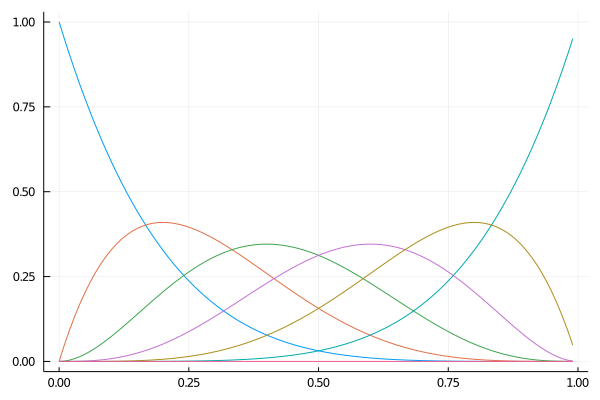

In [5]:
t = 0:0.01:0.99 # Зададим интервал
n = 5

for i in 0:(n+1)
    s = Float64[] # Создадим массив
    for x in t
        push!(s, bern(n, i, x)) # Рассчитаем значение функции и запишем в массив
    end
    global plt = plot!(t, s, label = :false) # Строим графики
end
    display(plt)

<h3><b>Задание N 2</b></h3> 
Напишите программу, которая вычисляет точки кривой Безье любого порядка с помо-
щью полиномов Бернштейна. Порядок кривой должен вычисляться автоматически на основе
количества точек, которые используются для построения. Сверьте результаты работы про-
граммы с таблицей 5 и с рисунком 22. Координаты точек: (1, 1), (2, 2), (4, 2), (5, 1), (2, 0),
(1, 1).

In [37]:
p = [[1, 1], [2, 0], [5, 1], [4, 2], [2, 2]] # Задали координаты точке
push!(p, p[1]) # Добавили первую дочку в конец, поскольку график замыкается
n = length(p) - 1; # Нашли n

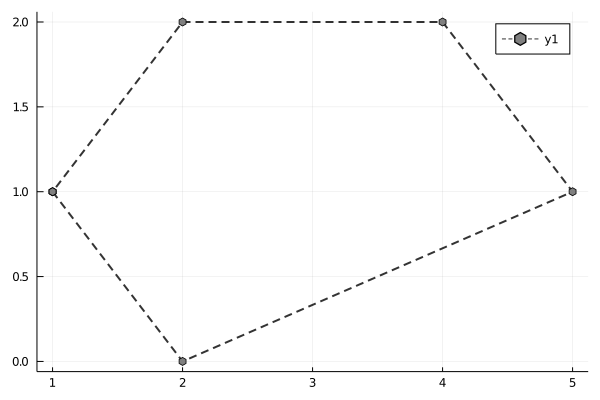

In [39]:
function point(p) # Функция, визуализирующая опорные точки
    x = []
    y = []
    for i in p
        push!(x, i[1])
        push!(y, i[2])
    end

    plot(x, y,
        line = (:black, 0.8, 2, :dash),
        markershape = :hexagon,
        markersize = 4,
        markercolor = :gray)
end

point(push!(p, p[1]))

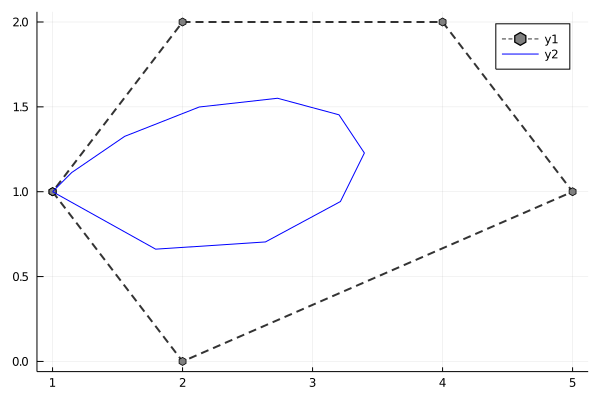

In [40]:
function bezier_func(p) # Функция, строящая кривую Безье
    n = length(p) - 1
    t = 0:0.01:1
    x = []
    y = []
    for t in 0:0.1:1
        b = [0, 0]
        for i in 0:n
            b += p[i+1] * bern(n, i, t)
        end
        push!(x, b[1])
        push!(y, b[2])
    end
    plot!(x, y,
        color = :blue)
end

bezier_func(p)

Output программы совпадает с таблицей в задании, Из этого можно сделать вывод тчо функция работает корректно. Плавности кривой можно достичь уменьшением шага t

<h3><b>Задание N 2</b></h3> 
Для кривых B(2, t), B(3, t), B(4, t) используйте матричные формулы. Сравните быстро-
действие универсальной функции из задания No2 с матричным вариантом (естественно для
n = 2, 3, 4).

Определим матричную функцию:

In [67]:
function bezier_matrx(p, a)
    n = length(p) - 1
    x = []
    y = []
    for t in 0:0.01:1
        n == 2 ? tt = [[t^2] [t] [1]] : false
        n == 3 ? tt = [[t^3] [t^2] [t] [1]] : false
        n == 4 ? tt = [[t^4] [t^3] [t^2] [t] [1]] : false

        b = tt*a*p
        push!(x, b[1][1])
        push!(y, b[1][2])
    end

    plot!(x, y,
    color = :blue)
end;

Переопределим функцию bezier_func() для более гладкой кривой.

In [32]:
function bezier_func(p) # Функция, строящая кривую Безье
    n = length(p) - 1
    t = 0:0.01:1
    x = []
    y = []
    for t in 0:0.01:1
        b = [0, 0]
        for i in 0:n
            b += p[i+1] * bern(n, i, t)
        end
        push!(x, b[1])
        push!(y, b[2])
    end
end;

<h5><b>Для n = 2

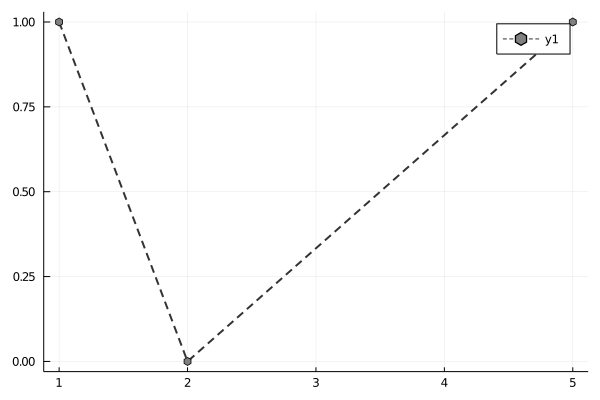

In [68]:
p = [[1, 1, 0], [2, 0, 0], [5, 1, 0]] # Задаём точки для матричной функции
point(p)

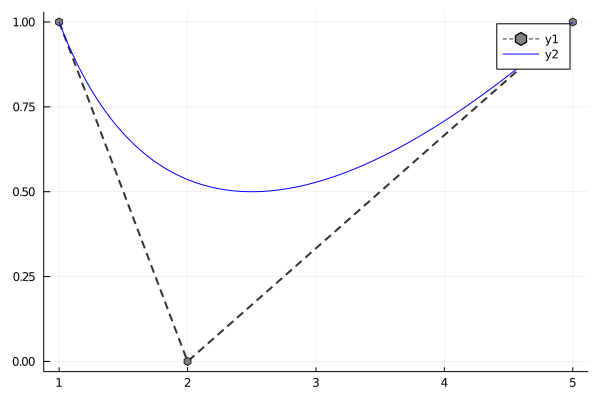

In [69]:
a = [[1, -2, 1] [-2, 2, 0] [1, 0, 0]] # задаём матрицу
bezier_matrx(p, a) # Строим кривую

<h5><b>Для n = 3</h5></b>

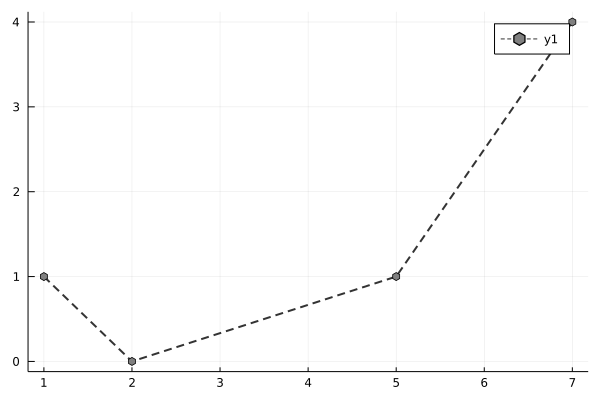

In [21]:
p = [[1, 1, 0], [2, 0, 0], [5, 1, 0], [7, 4, 0]] # Задаём точки
point(p)

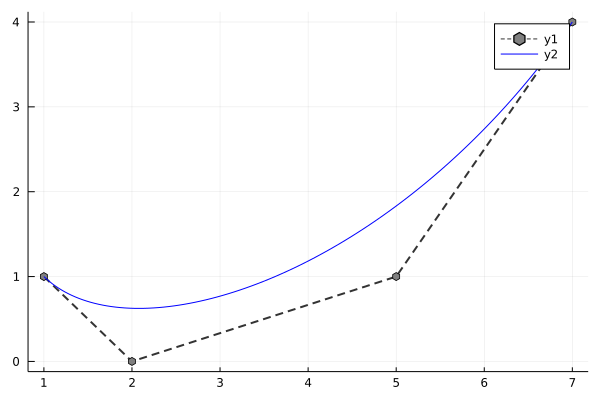

In [22]:
a = [[-1, 3, -3, 1] [3, -6, 3, 0] [-3, 3, 0, 0] [1, 0, 0, 0]] # Задаём матрицу
bezier_matrx(p, a) # Строим кривую

<b>Для n = 4</b>

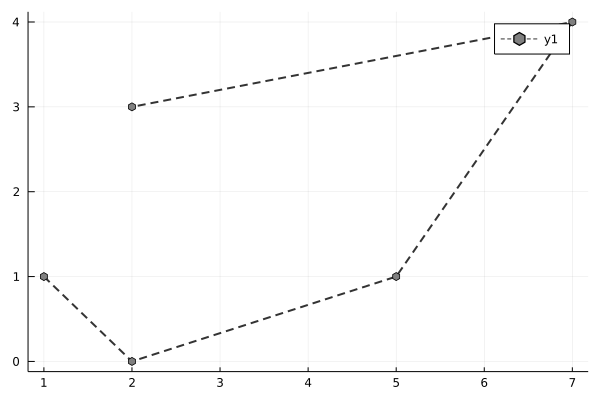

In [71]:
p = [[1, 1, 0], [2, 0, 0], [5, 1, 0], [7, 4, 0], [2, 3, 0]] # Задаём точки для матричной функции
point(p)

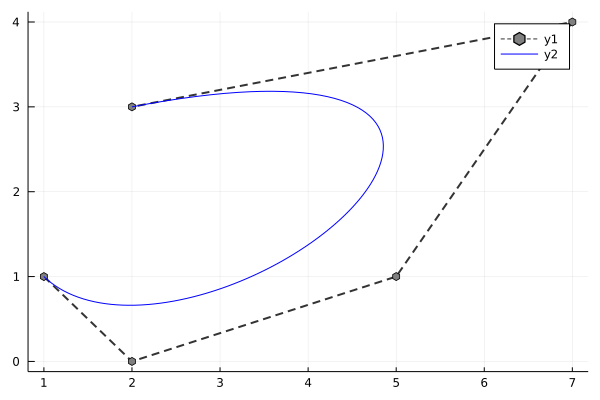

In [72]:
a = [[1, -4, 6, -4, 1] [-4, 12, -12, 4, 0] [6, -12, 6, 0, 0] [-4, 4, 0, 0, 0] [1, 0, 0, 0, 0]] # Задаём график
bezier_matrx(p, a) # Строим функцию

Мы построили кривые n = 2, 3, 4 при помощи матричной функции<br>
<h3><b>Быстродействие</b></h3>
Уберём визуализацию из функции:

In [74]:
function bezier_matrx(p, a)
    n = length(p) - 1
    x = []
    y = []
    for t in 0:0.01:1
        tt = [0 0 0]
        n == 2 ? tt = [[t^2] [t] [1]] : false
        n == 3 ? tt = [[t^3] [t^2] [t] [1]] : false
        n == 4 ? tt = [[t^4] [t^3] [t^2] [t] [1]] : false

        b = tt*a*p
        push!(x, b[1][1])
        push!(y, b[1][2])
    end
end;

In [45]:
using Pkg
Pkg.add("BenchmarkTools") # Установим пакет для замеры быстродействия
using BenchmarkTools

  Resolving package versions...
No Changes to `~/.julia/environments/v1.5/Project.toml`
No Changes to `~/.julia/environments/v1.5/Manifest.toml`


<h2><b>n = 2</b></h4>

In [76]:
pf = [[1, 1], [2, 0], [5, 1]]
pm = [[1, 1, 0], [2, 0, 0], [5, 1, 0]]
a = [[1, -2, 1] [-2, 2, 0] [1, 0, 0]]; # задаём матрицу

In [47]:
@benchmark bezier_func(pf) # Замеряем быстродействие универсальной функции

BenchmarkTools.Trial: 
  memory estimate:  153.49 KiB
  allocs estimate:  2851
  --------------
  minimum time:     1.485 ms (0.00% GC)
  median time:      2.309 ms (0.00% GC)
  mean time:        2.558 ms (1.46% GC)
  maximum time:     17.647 ms (81.79% GC)
  --------------
  samples:          1952
  evals/sample:     1

In [77]:
@benchmark bezier_matrx(pm, a) # Замеряем быстродействие матричной функции

BenchmarkTools.Trial: 
  memory estimate:  211.14 KiB
  allocs estimate:  2337
  --------------
  minimum time:     120.553 μs (0.00% GC)
  median time:      133.282 μs (0.00% GC)
  mean time:        196.952 μs (20.49% GC)
  maximum time:     15.134 ms (97.89% GC)
  --------------
  samples:          10000
  evals/sample:     1

<h2><b>n = 3</b></h4>

In [83]:
pf = [[1, 1], [2, 0], [5, 1], [7, 4]]
pm = [[1, 1, 0], [2, 0, 0], [5, 1, 0], [7, 4, 0]]
a = a = [[-1, 3, -3, 1] [3, -6, 3, 0] [-3, 3, 0, 0] [1, 0, 0, 0]]; # Задаём матрицу

In [84]:
@benchmark bezier_func(pf) # Замеряем быстродействие универсальной функции

BenchmarkTools.Trial: 
  memory estimate:  155.55 KiB
  allocs estimate:  2873
  --------------
  minimum time:     3.518 ms (0.00% GC)
  median time:      4.374 ms (0.00% GC)
  mean time:        4.747 ms (0.58% GC)
  maximum time:     20.316 ms (77.80% GC)
  --------------
  samples:          1053
  evals/sample:     1

In [85]:
@benchmark bezier_matrx(pm, a) # Замеряем быстродействие матричной функции

BenchmarkTools.Trial: 
  memory estimate:  242.70 KiB
  allocs estimate:  2640
  --------------
  minimum time:     139.825 μs (0.00% GC)
  median time:      165.601 μs (0.00% GC)
  mean time:        267.412 μs (18.28% GC)
  maximum time:     19.204 ms (98.26% GC)
  --------------
  samples:          10000
  evals/sample:     1

<h2><b>n = 4</b></h4>

In [86]:
pf = [[1, 1], [2, 0], [5, 1], [7, 2], [2, 3]]
pm = [[1, 1, 0], [2, 0, 0], [5, 1, 0], [7, 4, 0], [2, 3, 0]]
a = [[1, -4, 6, -4, 1] [-4, 12, -12, 4, 0] [6, -12, 6, 0, 0] [-4, 4, 0, 0, 0] [1, 0, 0, 0, 0]]; # задаём матрицу

In [87]:
@benchmark bezier_func(pf) # Замеряем быстродействие универсальной функции

BenchmarkTools.Trial: 
  memory estimate:  157.62 KiB
  allocs estimate:  2895
  --------------
  minimum time:     4.332 ms (0.00% GC)
  median time:      5.134 ms (0.00% GC)
  mean time:        5.539 ms (0.70% GC)
  maximum time:     23.992 ms (75.94% GC)
  --------------
  samples:          903
  evals/sample:     1

In [88]:
@benchmark bezier_matrx(pm, a) # Замеряем быстродействие матричной функции

BenchmarkTools.Trial: 
  memory estimate:  277.42 KiB
  allocs estimate:  2943
  --------------
  minimum time:     168.303 μs (0.00% GC)
  median time:      193.667 μs (0.00% GC)
  mean time:        295.565 μs (18.19% GC)
  maximum time:     16.042 ms (97.57% GC)
  --------------
  samples:          10000
  evals/sample:     1

<b>Как можем видеть, при всех n матричная функция оказалась быстрее как минимум на порядок</b>

<h3><b>Задание N 4</b></h3> 
Реализуйте построение кривой Безье по алгоритму де Кастельжо. Сравните быстродей-
ствие с универсальной функцией из задания No2. Нарисуйте опорные ломанные, точки на
которых вычисляет алгоритм де Кастельжо.

Создадим функцию:

In [91]:
function bezier_recursive()
    x = []
    y = []
    for t in 0:0.01:1
        pb = copy(p)
        for n in 1:length(pb) - 1
            for i in 1:length(pb) - 1
                pb[i] = pb[i] + t*(pb[i+1] - pb[i])
            end
            pop!(pb)
        end
        push!(x, pb[1][1])
        push!(y, pb[1][2])
    end
    plot!(x, y,
        color = :blue)
end;

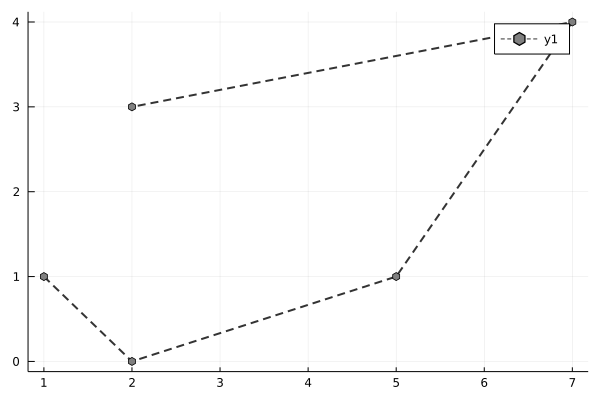

In [92]:
p = [[1.0, 1.0], [2.0, 0.0], [5.0, 1.0], [7.0, 4.0], [2.0, 3.0]] # Задаём точки для матричной функции
point(p)

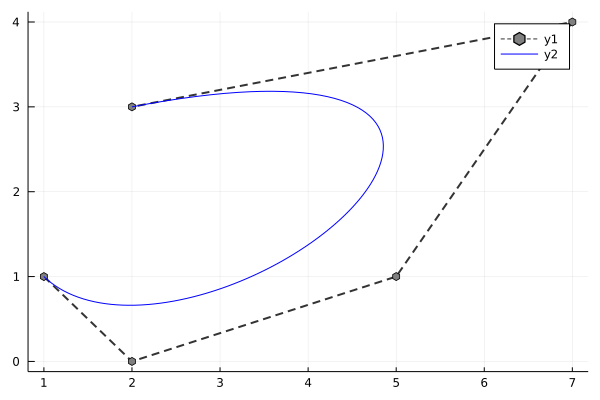

In [93]:
bezier_recursive()

<h3><b>Быстродействие</b></h3>

In [94]:
function bezier_recursive() # Убрали визуализацию для проверки на быстродействие
    x = []
    y = []
    for t in 0:0.01:1
        pb = copy(p)
        for n in 1:length(pb) - 1
            for i in 1:length(pb) - 1
                pb[i] = pb[i] + t*(pb[i+1] - pb[i])
            end
            pop!(pb)
        end
        push!(x, pb[1][1])
        push!(y, pb[1][2])
    end
end;

In [95]:
@benchmark bezier_recursive()

BenchmarkTools.Trial: 
  memory estimate:  380.00 KiB
  allocs estimate:  6276
  --------------
  minimum time:     632.762 μs (0.00% GC)
  median time:      707.080 μs (0.00% GC)
  mean time:        892.274 μs (8.39% GC)
  maximum time:     15.701 ms (91.55% GC)
  --------------
  samples:          5596
  evals/sample:     1

<b>Как можем видеть, рекурсивная функция быстрее универсальной, но медленее матричной<br><br><h2>Задание 5</h2><h3>Анимация</h3></b>

In [96]:
function bezier_recursive() # Уменьшили шаг для увеличения гладкости
    global x = []
    global y = []
    for t in 0:0.01:1
        pb = copy(p)
        for n in 1:length(pb) - 1
            push!(save, pb[1:end])
            for i in 1:length(pb) - 1
                pb[i] = pb[i] + t*(pb[i+1] - pb[i])
            end
            pop!(pb)
        end
        push!(x, pb[1][1])
        push!(y, pb[1][2])
    end
    plot!(x, y,
        line = (:blue, 0.8, 3))
end;

In [102]:
function vis(q) # Функция для шаговой визуализации
    plt = plot!()
    for i in 1:length(q)-1
        plt = plot([q[i][1], q[i+1][1]], [[q[i][2], q[i+1][2]]],
        label = :false,
        color = :grey,
        markershape = :hexagon,
        markersize = 2
        )
    end
    display(plt)
end;

In [104]:
save = []
bezier_recursive();

<h4><b>Анимируем</b><h4>

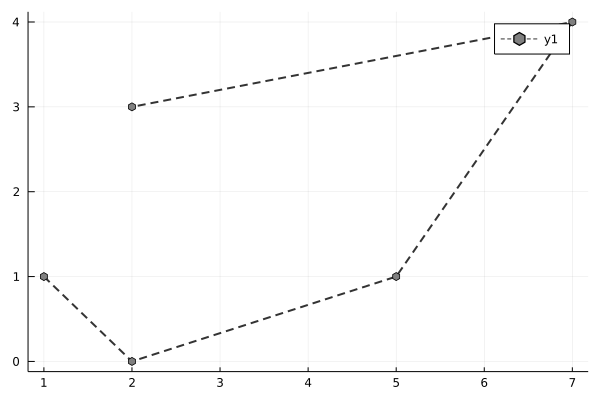

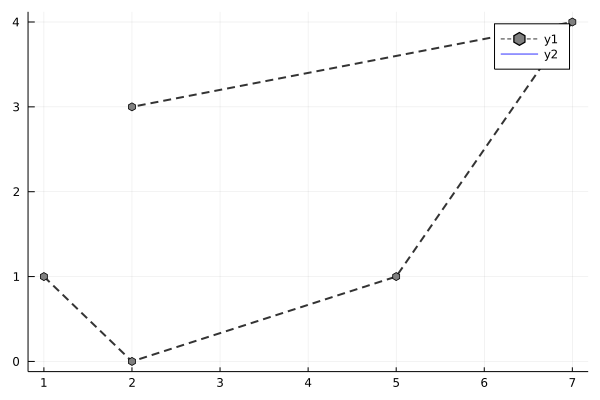

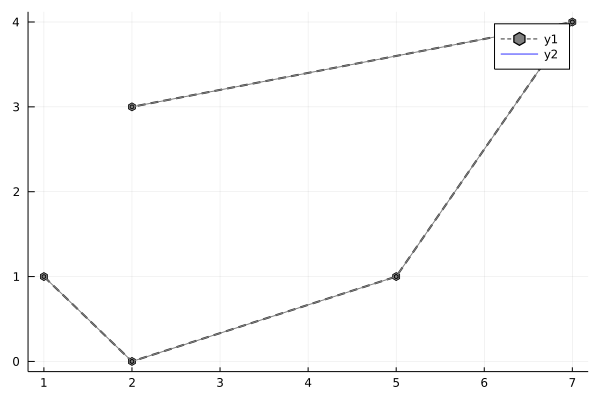

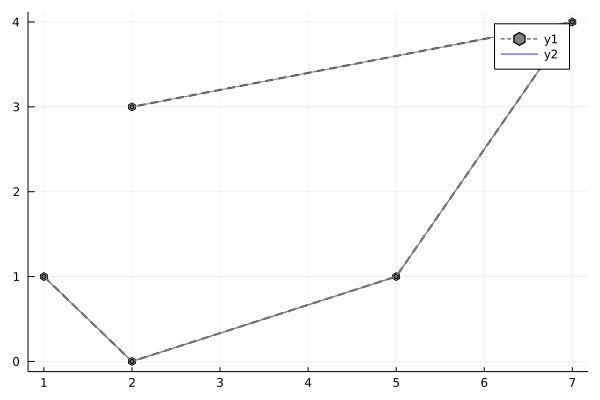

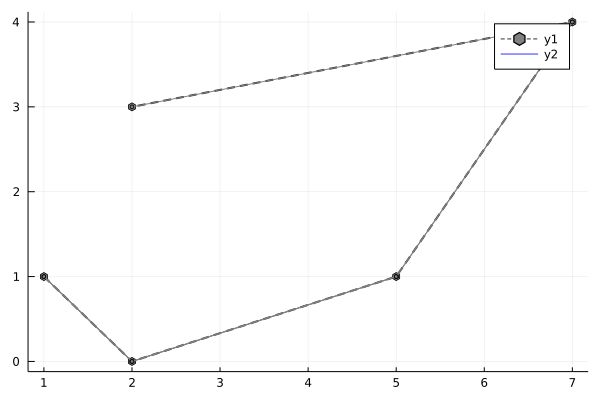

...

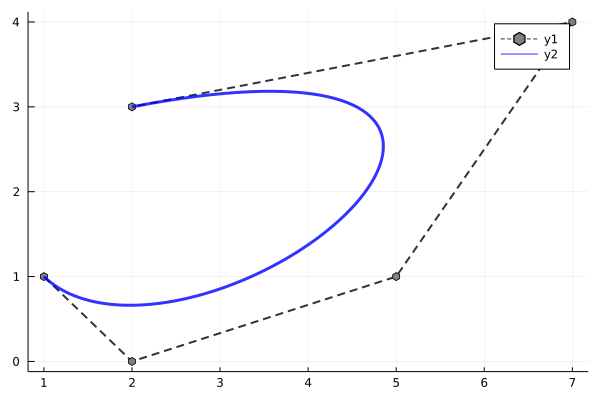

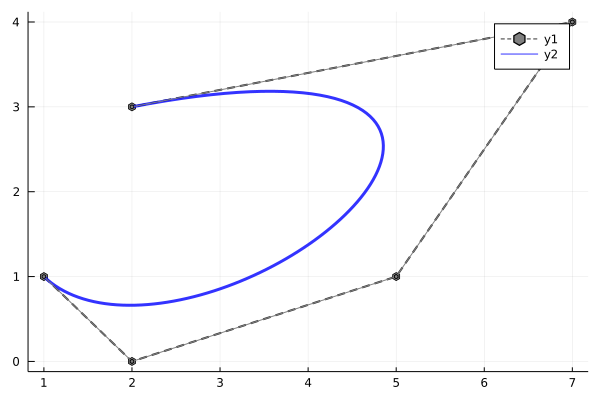

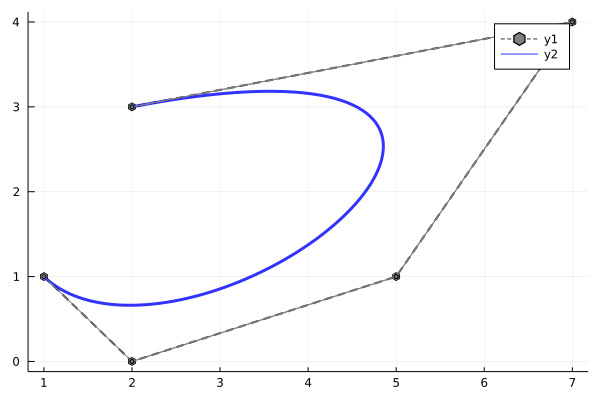

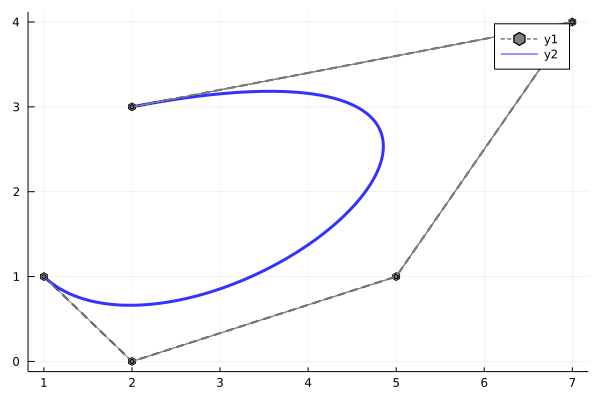

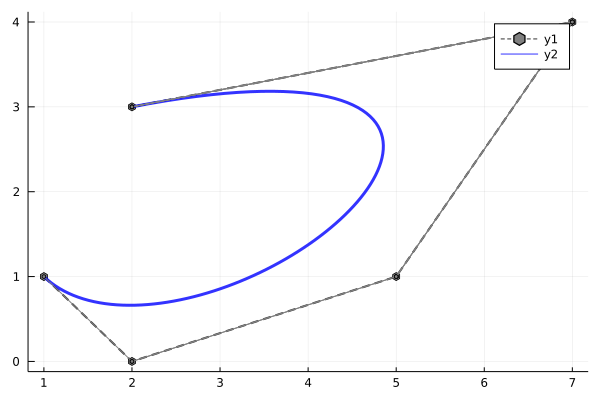

┌ Info: Saved animation to 
│   fn = /home/dz/Downloads/tmp.gif
└ @ Plots /home/dz/.julia/packages/Plots/vsE7b/src/animation.jl:104


Plots.AnimatedGif("/home/dz/Downloads/tmp.gif")
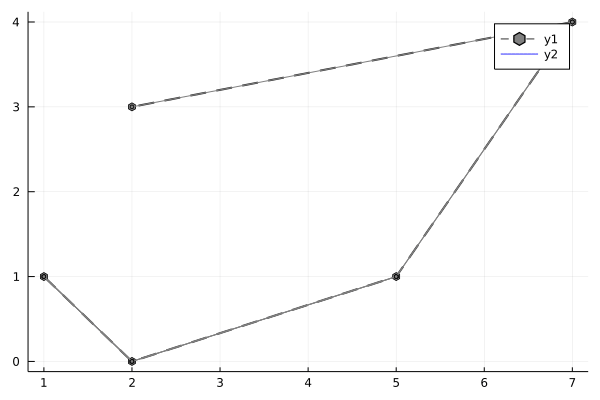

In [109]:
@gif for i in 1:length(x)
    point(p) |> display
    plot!(x[1:i], y[1:i], line = (:blue, 0.8, 3)) |> display
    for j in (i-1)*4+1:i*4
            vis(save[j])
    end
end